# Pose Estimation - Training Models from New Datasets

References: https://docs.ultralytics.com/

In [5]:
#!pip install ultralytics
import ultralytics
from ultralytics import YOLO

from google.colab import files
from huggingface_hub import hf_hub_download

## Training a New Model to Detect Hand Keypoints

As we saw in the live demo, the out-of-the-box pose estimation model does not support articulation of finger movement or other fine hand gestures. We will now use the Hand Keypoints dataset (available through the Ultralytics API) to train a new model that is capable of this functionality, and demo it live on our webcam.

https://docs.ultralytics.com/datasets/pose/hand-keypoints/

In [ ]:
# Load copy of pretrained model and train on Hand Keypoints dataset:
hand_model = YOLO("yolo11n-pose.pt")  # load a pretrained model (recommended for training)

# Train the model
hand_train_results = hand_model.train(data="hand-keypoints.yaml", epochs=30, imgsz=640)

In [3]:
# In the interest of time, we will not train this model live, but you can download one that I trained ahead of time here:
repo_id = "SVeldman/hand_keypoints"  # Replace with the actual repo ID
filename = "hand_model.pt"  # Replace with the actual filename
hand_path = hf_hub_download(repo_id=repo_id, filename=filename)

hand_model = YOLO(hand_path)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


hand_model.pt:   0%|          | 0.00/6.46M [00:00<?, ?B/s]

In [ ]:
# Optional: Save "hand_model" as "hand_model.pt" and then download
hand_model.save("hand_model.pt")
files.download('hand_model.pt')

Now that we have our newly-trained model, let's see how it performs on a few static images:


0: 640x640 2 hands, 8.1ms
1: 640x640 1 hand, 8.1ms


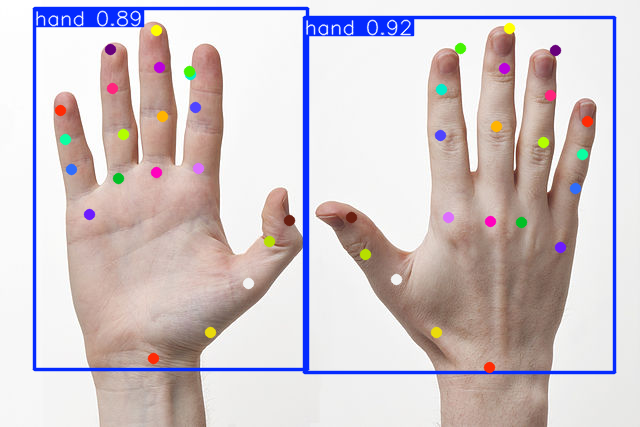

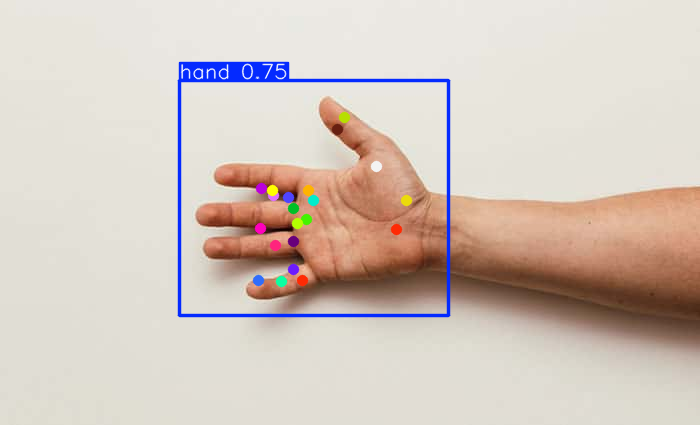

Speed: 3.4ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


In [9]:
# Define image paths:
hand_1 = "https://upload.wikimedia.org/wikipedia/commons/thumb/3/32/Human-Hands-Front-Back.jpg/640px-Human-Hands-Front-Back.jpg"
hand_2 = "https://www.caryortho.com/wp-content/uploads/2020/04/What-Does-a-Hand-Specialist-Do.jpg"

# Define a generator of results objects:
results = hand_model([hand_1, hand_2], stream=True)

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    probs = result.probs  # Probs object for classification outputs
    result.show()  # display to screen
    #result.save(filename="result.jpg")  # save to disk

But how does it do in real time? Let's return to the "YOLO_pose.py" file we used in the earlier demo, and see how this model performs on a live webcam feed.

## Train a New Model to Detect Animal Poses:
We have seen out-of-the-box inference based on the COCO dataset, as well as the new functionality provided by the Hand Keypoints dataset. Now we will train one last model, this time to predict keypoints on tigers.

Finally, we will see how this new model can be used to run real-time inference on a video of tigers from YouTube (sorry, we didn't have any tigers available live for this demo).

https://docs.ultralytics.com/datasets/pose/tiger-pose/

In [ ]:
# Load a fresh copy of the pretrained model:
tiger_model = YOLO("yolo11n-pose.pt")  # load a pretrained model (recommended for training)

# Train the model on Tiger-Pose dataset:
tiger_train_results = tiger_model.train(data="tiger-pose.yaml", epochs=150, imgsz=640)

In [6]:
# In the interest of time, we will not train this model live, but you can download one that I trained ahead of time here:
repo_id = "SVeldman/tiger_pose"
filename = "tiger_model.pt"
tiger_path = hf_hub_download(repo_id=repo_id, filename=filename)

tiger_model = YOLO(tiger_path)

tiger_model.pt:   0%|          | 0.00/5.91M [00:00<?, ?B/s]

In [ ]:
# Optional: Save "tiger_model" as "tiger_model.pt" and then download
tiger_model.save("tiger_model.pt")
files.download('tiger_model.pt')

In [15]:
# Define paths to images for inference:
tiger_1 = "https://i.natgeofe.com/k/07176791-9577-4e31-b101-b10ca7ca9a3c/Stripes_Tiger-Terrific_KIDS_0722_16x9.jpg"
tiger_2 = "https://animals.sandiegozoo.org/sites/default/files/inline-images/tiger_amur_snow.jpg"
tiger_3 = "https://files.worldwildlife.org/wwfcmsprod/images/Tiger_resting_Bandhavgarh_National_Park_India/hero_small/6aofsvaglm_Medium_WW226365.jpg"


0: 640x640 1 tiger, 23.8ms
1: 640x640 (no detections), 23.8ms
2: 640x640 (no detections), 23.8ms


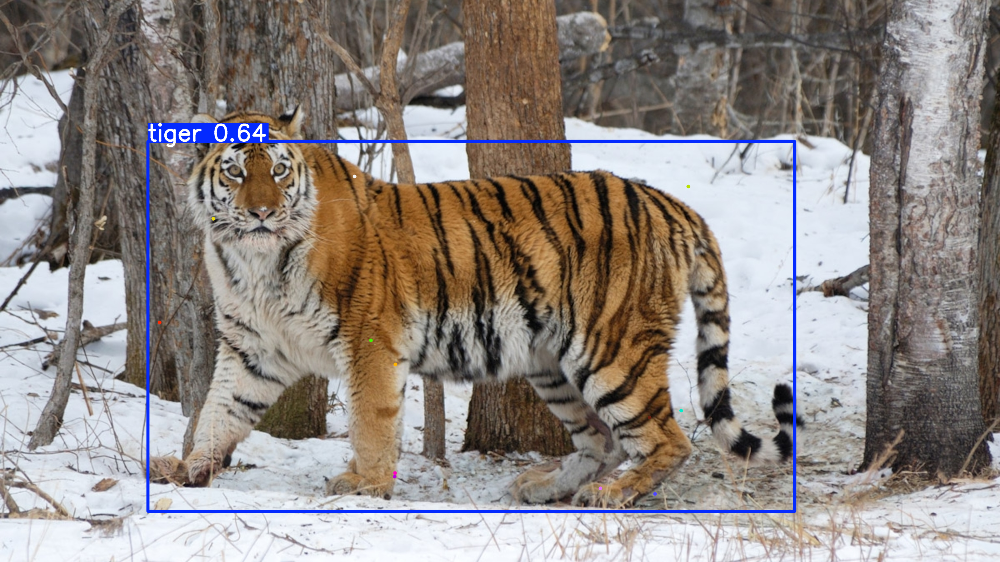

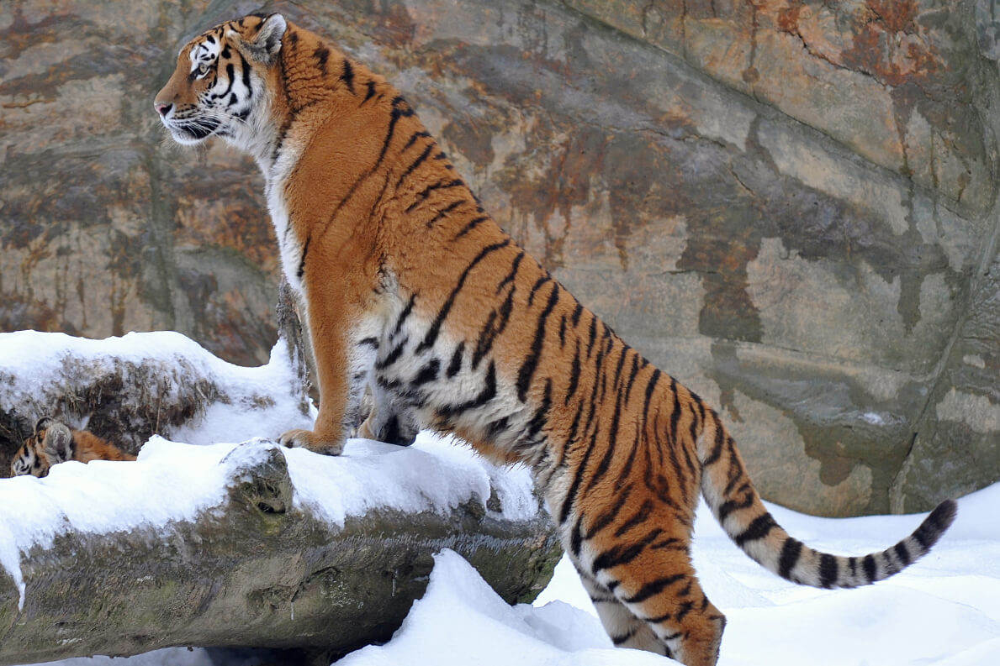

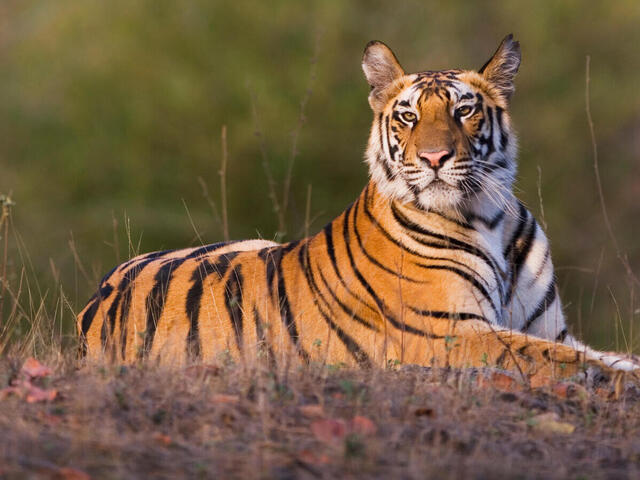

Speed: 3.3ms preprocess, 23.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


In [16]:
# Define a generator of results objects:
results = tiger_model([tiger_1, tiger_2, tiger_3], stream=True)

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    probs = result.probs  # Probs object for classification outputs
    result.show()  # display to screen
    #result.save(filename="result.jpg")  # save to disk

Based on its performance on static images, we can see that this model still needs some work. But how does it do in real time? Let's to the "YOLO_pose.py" file again, and see how this model performs on a YouTube video of a tiger.